[![Open holes - Construction safety](https://www.keithconstruction.ca/wp-content/uploads/2020/09/Construction-Safety-1024x536.png)](https://github.com/BitSpaceDevelopment/CV-Construction-safety-model)

# Train YOLOv5

---
[![GitHub](https://badges.aleen42.com/src/github.svg)](https://github.com/BitSpaceDevelopment/CV-Construction-safety-model)
## Use case: Open hole detection
Link to data: https://universe.roboflow.com/northeastern-4sfxe/construction-safety-open-hole-excavation-detection


 This model will be deployed to our Jetson-based edge inference systems for job sites allowing us to monitor and report on unsafe conditions surrounding excavation and earth moving. This model should run on a single-board computer; we will likely combine functionality with the PPE model to determine if somebody is wearing a harness near an unsafe excavation. 

---
## About the model:

YOLOv5 is an object detection algorithm and architecture that is part of the YOLO (You Only Look Once) family of models. It is the latest iteration of the YOLO series, developed by Ultralytics. V5 is one common algorithm among many versions available right now due to its performance and stabability.

---

## Pro Tip: Use GPU Acceleration

If you are running this notebook in Google Colab, navigate to `Edit` -> `Notebook settings` -> `Hardware accelerator`, set it to `GPU`, and then click `Save`. This will ensure your notebook uses a GPU, which will significantly speed up model training times.

---

## Steps in this training

In this notebook, we are going to cover:

- 1. Set GPU
- 2. Install YOLOv5
- 3. Preparing a custom dataset: Upload, annotate and prepared on Roboflow
- 4. Custom Training
- 5. Validate Custom Model
- 6. Download weights
- 7. Deploy models

---
## Visualization of interactive workflow:
![](https://2486075003-files.gitbook.io/~/files/v0/b/gitbook-x-prod.appspot.com/o/spaces%2F-M6S9nPJhEX9FYH6clfW%2Fuploads%2FfHpPTWNdCVR9qHQDeskF%2FScreen%20Shot%202022-08-24%20at%2012.35.36%20PM.png?alt=media&token=623927fe-3099-4ccd-8aaa-890bf5c0b03b)
**Let's begin!**
---
---

## 1. Set GPU

Let's make sure that we have access to GPU. We can use `nvidia-smi` command to do that. In case of any problems navigate to `Edit` -> `Notebook settings` -> `Hardware accelerator`, set it to `GPU`, and then click `Save`.

In [1]:
# Check if we have the access to GPU
!nvidia-smi

Sun Jun 11 17:02:47 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 525.85.12    Driver Version: 525.85.12    CUDA Version: 12.0     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   38C    P8     9W /  70W |      0MiB / 15360MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [2]:
# Check the original path of the working directory
import os
HOME = os.getcwd()
print(HOME)

/content


## 2. Install YOLOv5

We install the model and dependency list from Github.

In [3]:
# Clone YOLOv5 repository
!git clone https://github.com/ultralytics/yolov5  # clone repo
%cd yolov5
!git reset --hard 064365d8683fd002e9ad789c1e91fa3d021b44f0

Cloning into 'yolov5'...
remote: Enumerating objects: 15978, done.
remote: Counting objects: 100% (147/147), done.
remote: Compressing objects: 100% (71/71), done.
remote: Total 15978 (delta 89), reused 118 (delta 76), pack-reused 15831
Receiving objects: 100% (15978/15978), 14.61 MiB | 9.59 MiB/s, done.
Resolving deltas: 100% (10958/10958), done.
/content/yolov5
HEAD is now at 064365d Update parse_opt() in export.py to work as in train.py (#10789)


In [4]:
# Install dependencies as necessary
!pip install -qr requirements.txt  # Install dependencies (ignore errors)
import torch

from IPython.display import Image, clear_output  # To display images
from utils.downloads import attempt_download  # To download models/datasets

# Clear_output()
print('Setup complete. Using torch %s %s' % (torch.__version__, torch.cuda.get_device_properties(0) if torch.cuda.is_available() else 'CPU'))

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 184.3/184.3 kB 9.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 7.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 64.2 MB/s eta 0:00:00
Setup complete. Using torch 2.0.1+cu118 _CudaDeviceProperties(name='Tesla T4', major=7, minor=5, total_memory=15101MB, multi_processor_count=40)


## 3. Preparing a custom dataset

We have added data, relabeled, changed annotations, and preprocessed (argumentation) all images for this step on Robotflow. The below code is to download pre-processed dataset from the site, which is compatible with YOLOv5.



In [5]:
# Navigate to the folder
%cd /content/yolov5

# Download data (from snipet code on Roboflow)
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="bvgx6NFEHR0zZurL8c9w")
project = rf.workspace("northeastern-4sfxe").project("construction-safety-open-hole-excavation-detection")
dataset = project.version(1).download("yolov5")

/content/yolov5
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 kB 2.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 5.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.8/67.8 kB 7.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.5/54.5 kB 5.0 MB/s eta 0:00:00
  Created wheel for wget: filename=wget-3.2-py3-none-any.whl size=9657 sha256=1b67c8d9084ac08ed81063e4c851688a96d2f671b81fc2aa7db5175883d1899e
  Stored in directory: /root/.cache/pip/wheels/8b/f1/7f/5c94f0a7a505ca1c81cd1d9208ae2064675d97582078e6c769
Successfully built wget
  Attempting uninstall: pyparsing
    Found existing installation: pyparsing 3.0.9
    Uninstalling pyparsing-3.0.9:
      Successfully uninstalled pyparsing-3.0.9
  Attempting uninstall: idna
    Found existing installation: idna 3.4
    Uninstallin

loading Roboflow workspace...
loading Roboflow project...

Extracting Dataset Version Zip to Construction-Safety---Open-hole-/-Excavation-Detection-1 in yolov5pytorch:: 100%|██████████| 3696/3696 [00:01<00:00, 2397.24it/s]


In [6]:
# Check location of dataset
dataset.location

'/content/yolov5/Construction-Safety---Open-hole-/-Excavation-Detection-1'

## 4.Training the YOLOv5 model

Here, we are able to pass a number of arguments:
- **img:** define input image size. Since we already changed size from Roboflow, we keep the size as 640 x 640.
- **batch:** determine batch size.
- **epochs:** define the number of training epochs. 
- **data:** Our dataset locaiton is saved in the `dataset.location`
- **weights:** specify a path to weights to start transfer learning from. Here we choose the generic COCO pretrained checkpoint.
- **cache:** cache images for faster training, we use Ram in this case.
- **device:** choose GPU or CPU.
- **patience:** early stop hyper-parameter (Model will stop after N epochs without improvement). In this case, N =20.

In [7]:
# Custom train the model
!python train.py --batch 16 --epochs 200 --data {dataset.location}/data.yaml --weights yolov5s.pt --cache --device 0 --patience 20 

2023-06-11 17:05:59.536835: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-06-11 17:06:00.482608: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
train: weights=yolov5s.pt, cfg=, data=/content/yolov5/Construction-Safety---Open-hole-/-Excavation-Detection-1/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=200, batch_size=16, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=ram, image_weights=False, device=0, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=exp, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=20, freeze=[0], save_period=

**Hyper-parameter summary**:
- `weights`: Path to the initial weights file (`yolov5s.pt`) for the model.
- `cfg`: Path to the model configuration file (not specified in the provided command).
- `data`: Path to the YAML file (`{dataset.location}/data.yaml`) containing dataset-related information.
- `hyp`: Path to the hyperparameters YAML file (`data/hyps/hyp.scratch-low.yaml`) defining training hyperparameters.
- `epochs`: Number of training epochs (200).
- `batch_size`: Batch size used during training (16).
- `imgsz`: Input image size during training (640x640 pixels).
- `rect`: Use rectangular training images (False).
- `resume`: Resume training from the latest checkpoint (False).
- `nosave`: Do not save any checkpoints during training (False).
- `noval`: Disable the validation evaluation during training (False).
- `noautoanchor`: Disable auto anchor calculation (False).
- `noplots`: Disable plotting during training (False).
- `evolve`: Use hyperparameter evolution (None).
- `bucket`: Bucket to sync checkpoints with (empty).
- `cache`: Cache images for faster training (ram).
- `image_weights`: Use image weights for training (False).
- `device`: Device index for training (0).
- `multi_scale`: Use multi-scale training (False).
- `single_cls`: Train as a single-class object detection (False).
- `optimizer`: Optimizer algorithm used for training (SGD).
- `sync_bn`: Enable synchronized batch normalization (False).
- `workers`: Number of data loading workers (8).
- `project`: Name of the training project (runs/train).
- `name`: Experiment name (exp).
- `exist_ok`: Allow overwriting existing training directories (False).
- `quad`: Use quadratic labels (False).
- `cos_lr`: Use cosine learning rate schedule (False).
- `label_smoothing`: Label smoothing factor (0.0).
- `patience`: Patience value for early stopping (20).
- `freeze`: List of layers to freeze during training ([0]). This means we only keep the first layer and train all of the rest.
- `save_period`: Number of iterations between saving checkpoints (-1).
- `seed`: Random seed for reproducibility (0).
- `local_rank`: Local rank of the training process (-1).
- `entity`: Wandb entity for logging (None).
- `upload_dataset`: Upload dataset to Wandb (False).
- `bbox_interval`: Number of iterations between computing mAP (-1).
- `artifact_alias`: Alias to use for the artifact (latest).
- `lr0`: Initial learning rate (0.01).
- `lrf`: Final learning rate (0.01).
- `momentum`: SGD optimizer momentum (0.937).
- `weight_decay`: Weight decay value (0.0005).
- `warmup_epochs`: Number of warm-up epochs (3.0).
- `warmup_momentum`: Warm-up momentum value (0.8).
- `warmup_bias_lr`: Warm-up bias learning rate value (0.1).
- `box`: Loss weight for bounding box localization (0.05).
- `cls`: Loss weight for object class prediction (0.5).
- `cls_pw`: Class loss weight power (1.0).
- `obj`: Loss weight for objectness prediction (1.0).
- `obj_pw`: Object loss weight power (1.0).
- `iou_t`: IoU threshold for object confidence loss (0.2).
- `anchor_t`: Anchor-based T-anchor threshold (4.0).
- `fl_gamma`: Focal loss gamma value (0.0).
- `hsv_h`: HSV hue augmentation value (0.015).
- `hsv_s`: HSV saturation augmentation value (0.7).
- `hsv_v`: HSV value augmentation value (0.4).
- `degrees`: Image rotation augmentation (0.0).
- `translate`: Image translation augmentation (0.1).
- `scale`: Image scale augmentation (0.5).
- `shear`: Image shear augmentation (0.0).
- `perspective`: Image perspective augmentation (0.0).
- `flipud`: Flip the image vertically augmentation (0.0).
- `fliplr`: Flip the image horizontally augmentation (0.5).
- `mosaic`: Use mosaic data augmentation (1.0).
- `mixup`: Mixup data augmentation (0.0).


## 5. Evaluation of the Model

### 5.1. Evaluate Custom YOLOv5 Detector Performance
Training losses and performance metrics are saved to Tensorboard and also to a logfile.

Therefore, we can take a look at the board to evaluate the performance.

In [8]:
# Start tensorboard by accessing logs saved in the folder "runs"
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

### 5.2. Run Inference  With Trained Weights
We also can run inference with a pretrained checkpoint on contents of `test/images` folder downloaded from Roboflow.

In [9]:
!python detect.py --weights runs/train/exp/weights/best.pt --conf 0.5 --source {dataset.location}/test/images

detect: weights=['runs/train/exp/weights/best.pt'], source=/content/yolov5/Construction-Safety---Open-hole-/-Excavation-Detection-1/test/images, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.5, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-72-g064365d Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
Model summary: 157 layers, 7020913 parameters, 0 gradients, 15.8 GFLOPs
image 1/35 /content/yolov5/Construction-Safety---Open-hole-/-Excavation-Detection-1/test/images/16_jpg.rf.402c681211cb280d95a652826f9080d4.jpg: 640x640 1 Safety-bollard, 2 Safety-cones, 11.6ms
image 2/35 /content/yolov5/Construction-Safety---Open-hole-/-Excavation-Detection-1/test/i

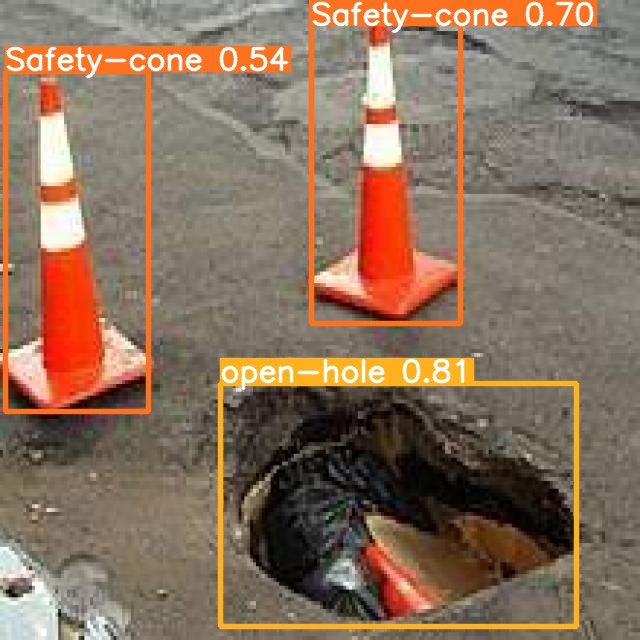

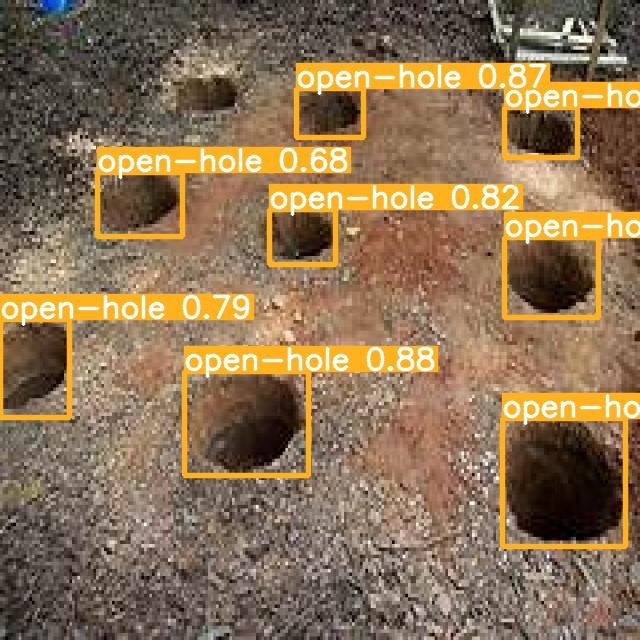

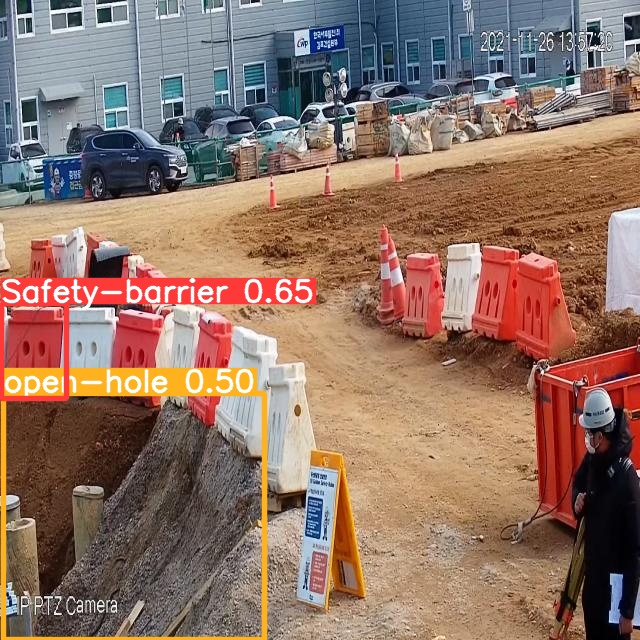

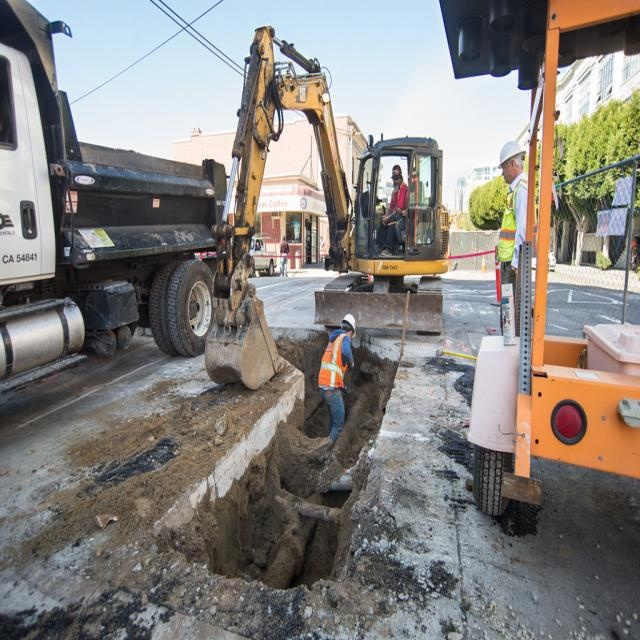

In [11]:
#Display inference on ALL test images
import glob
from IPython.display import Image, display

i = 0
limit = 4 # max images to print is 5
for imageName in glob.glob('/content/yolov5/runs/detect/exp/*.jpg'): 
    if i < limit:
      display(Image(filename=imageName))
      print("\n")
    i = i + 1

## 6. Export model weights for later use

Export the model weights and save them to use later.

In [12]:
#export your model's weights for future use
from google.colab import files
files.download('./runs/train/exp/weights/best.pt')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


## 7. Deploy on Roboflow

Upload model weights back to Roboflow for inference.

In [13]:
# Setup access to your workspace
from roboflow import Roboflow
rf = Roboflow(api_key="bvgx6NFEHR0zZurL8c9w")
project = rf.workspace("northeastern-4sfxe").project("construction-safety-open-hole-excavation-detection")
version = project.version(1)
version.deploy("yolov5", "/content/yolov5/runs/train/exp/")

loading Roboflow workspace...
loading Roboflow project...
View the status of your deployment at: https://app.roboflow.com/northeastern-4sfxe/construction-safety-open-hole-excavation-detection/deploy/1
Share your model with the world at: https://universe.roboflow.com/northeastern-4sfxe/construction-safety-open-hole-excavation-detection/model/1


# Thank you!